In [2]:
import pandas as pd

In [4]:
df=pd.read_excel('/Users/eldanizarifzada/Downloads/Practice.xlsx')

In [5]:
df

,Unnamed: 0,id,transaction_date,amount,inactivity
0,0,C1,2025-03-19 15:05:00,787.48000,46
1,1,C1,2025-03-19 15:05:00,787.48000,46
2,2,C2,2025-04-18 15:33:00,873.05492,12
3,3,C2,2025-04-18 15:33:00,873.05492,12
4,4,C2,2025-04-18 15:33:00,873.05492,12
...,...,...,...,...,...
262247,262247,C198522,2025-03-14 14:28:00,828.12000,27
262248,262248,C198522,2025-03-14 14:28:00,828.12000,27
262249,262249,C198523,2025-04-24 19:08:00,335.00000,10
262250,262250,C198523,2025-04-24 19:08:00,335.00000,10


In [14]:
df[df['id']=='C198524']['inactivity'].nunique()

1

In [16]:
df.drop('Unnamed: 0', axis=1, inplace=True)

In [20]:
df.drop_duplicates(inplace=True)

In [22]:
df

,id,transaction_date,amount,inactivity
0,C1,2025-03-19 15:05:00,787.48000,46
2,C2,2025-04-18 15:33:00,873.05492,12
6,C3,2025-04-27 20:19:00,448.35000,21
7,C3,2025-03-14 09:45:00,404.89000,21
8,C4,2025-04-29 07:57:00,1518.37000,4
...,...,...,...,...
262243,C198521,2025-03-30 14:32:00,1713.85600,14
262245,C198521,2025-03-30 14:56:00,1713.85600,14
262247,C198522,2025-03-14 14:28:00,828.12000,27
262249,C198523,2025-04-24 19:08:00,335.00000,10


In [30]:
df[df['id']=='C99991'].amount

131577    522.456
131578    323.360
Name: amount, dtype: float64

In [32]:
monetary = df.groupby('id').mean()

In [34]:
monetary

,transaction_date,amount,inactivity
id,,,
C1,2025-03-19 15:05:00,787.480000,46.0
C10,2025-04-02 11:43:00,335.000000,50.0
C1000,2025-03-22 10:02:00,402.780000,57.0
C10000,2025-04-02 16:13:00,517.860000,3.0
C100000,2025-04-03 15:01:00,1800.720878,41.0
...,...,...,...
C99990,2025-03-26 00:53:00,444.095275,48.0
C99991,2025-04-04 13:02:00,422.908000,18.0
C99996,2025-03-18 21:30:00,557.040000,65.0


In [36]:
df['transaction_date'] = pd.to_datetime(df['transaction_date']).dt.date

In [38]:
df

,id,transaction_date,amount,inactivity
0,C1,2025-03-19,787.48000,46
2,C2,2025-04-18,873.05492,12
6,C3,2025-04-27,448.35000,21
7,C3,2025-03-14,404.89000,21
8,C4,2025-04-29,1518.37000,4
...,...,...,...,...
262243,C198521,2025-03-30,1713.85600,14
262245,C198521,2025-03-30,1713.85600,14
262247,C198522,2025-03-14,828.12000,27
262249,C198523,2025-04-24,335.00000,10


In [85]:
frequency = df.groupby('id').nunique()[['transaction_date']]

In [119]:
monetary

,transaction_date,monetary,inactivity
id,,,
C1,2025-03-19 15:05:00,787.480000,46.0
C10,2025-04-02 11:43:00,335.000000,50.0
C1000,2025-03-22 10:02:00,402.780000,57.0
C10000,2025-04-02 16:13:00,517.860000,3.0
C100000,2025-04-03 15:01:00,1800.720878,41.0
...,...,...,...
C99990,2025-03-26 00:53:00,444.095275,48.0
C99991,2025-04-04 13:02:00,422.908000,18.0
C99996,2025-03-18 21:30:00,557.040000,65.0


In [89]:
df.rename({"inactivity" : "recency"}, axis = 1, inplace = True)

frequency.rename({"transaction_date" : "frequency"}, axis = 1, inplace = True)

monetary.rename({"amount" : "monetary"}, axis = 1, inplace = True)

In [91]:
df

,id,transaction_date,amount,recency
0,C1,2025-03-19,787.48000,46
2,C2,2025-04-18,873.05492,12
6,C3,2025-04-27,448.35000,21
7,C3,2025-03-14,404.89000,21
8,C4,2025-04-29,1518.37000,4
...,...,...,...,...
262243,C198521,2025-03-30,1713.85600,14
262245,C198521,2025-03-30,1713.85600,14
262247,C198522,2025-03-14,828.12000,27
262249,C198523,2025-04-24,335.00000,10


In [111]:
recency=df[['id', 'recency']]

In [113]:
recency.drop_duplicates(inplace=True)

/var/folders/hb/5qplwbgn6kz_278njx67_1k40000gn/T/ipykernel_46035/3511867455.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  recency.drop_duplicates(inplace=True)


In [115]:
recency

,id,recency
0,C1,46
2,C2,12
6,C3,21
8,C4,4
13,C5,28
...,...,...
262239,C198520,18
262241,C198521,14
262247,C198522,27
262249,C198523,10


In [121]:
result = recency.merge(frequency, on='id').merge(monetary, on='id')

In [123]:
result

,id,recency,frequency,transaction_date,monetary,inactivity
0,C1,46,1,2025-03-19 15:05:00,787.480000,46.0
1,C2,12,1,2025-04-18 15:33:00,873.054920,12.0
2,C3,21,2,2025-04-05 15:02:00,426.620000,21.0
3,C4,4,2,2025-05-03 09:21:20,1292.323333,4.0
4,C5,28,1,2025-04-24 18:29:00,2179.147120,28.0
...,...,...,...,...,...,...
135448,C198520,18,2,2025-05-03 00:18:30,806.875000,18.0
135449,C198521,14,2,2025-04-11 04:26:20,1790.129333,14.0
135450,C198522,27,1,2025-03-14 14:28:00,828.120000,27.0
135451,C198523,10,1,2025-04-24 19:08:00,335.000000,10.0


In [129]:
result.drop(['transaction_date', 'inactivity'], axis=1, inplace=True)

In [131]:
result

,id,recency,frequency,monetary
0,C1,46,1,787.480000
1,C2,12,1,873.054920
2,C3,21,2,426.620000
3,C4,4,2,1292.323333
4,C5,28,1,2179.147120
...,...,...,...,...
135448,C198520,18,2,806.875000
135449,C198521,14,2,1790.129333
135450,C198522,27,1,828.120000
135451,C198523,10,1,335.000000


In [133]:
from sklearn.preprocessing import StandardScaler

In [135]:
scaler = StandardScaler()

In [137]:
X = result[['recency', 'frequency', 'monetary']]

X_scaled = scaler.fit_transform(X)

In [139]:
from sklearn.cluster import KMeans

In [141]:
import matplotlib.pyplot as plt

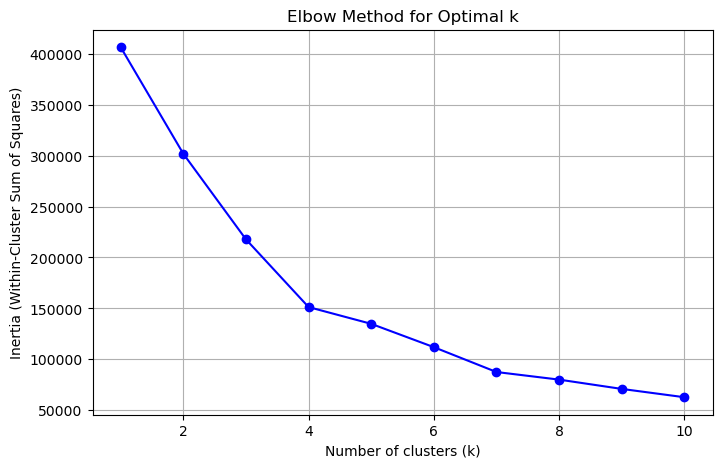

In [143]:
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()

In [145]:
model = KMeans(n_clusters=4)

In [147]:
model.fit(X_scaled)

KMeans(n_clusters=4)

In [153]:
X['pred'] = model.predict(X_scaled)

In [155]:
X

,recency,frequency,monetary,pred
0,46,1,787.480000,0
1,12,1,873.054920,0
2,21,2,426.620000,1
3,4,2,1292.323333,1
4,28,1,2179.147120,3
...,...,...,...,...
135448,18,2,806.875000,1
135449,14,2,1790.129333,1
135450,27,1,828.120000,0
135451,10,1,335.000000,0


In [159]:
import plotly.express as px
features=X.columns[:3]
fig = px.scatter_3d(
    X,
    x=features[0],
    y=features[1],
    z=features[2],
    color=X['pred'].astype(str),
    title='3D KMeans Clusters (k=4)',
    labels={'color' : 'pred'}
)



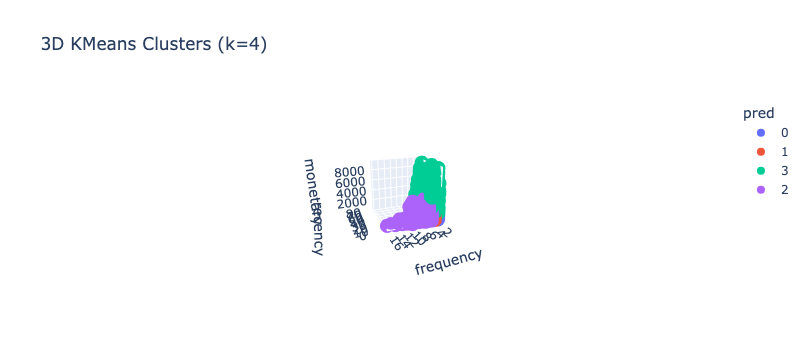

In [161]:
fig

In [167]:
cluster_centers = pd.DataFrame(model.cluster_centers_, columns=X.columns[:-1])

In [169]:
cluster_centers

,recency,frequency,monetary
0,0.050978,-0.312888,-0.162625
1,-0.244812,1.677325,-0.150479
2,-0.737722,4.840594,0.064960
3,-0.058173,-0.177490,3.337436


In [171]:
cluster_summary = X.groupby('pred').mean()
print(cluster_summary)

        recency  frequency     monetary
pred                                   
0     34.687298   1.000000   612.931449
1     28.206007   2.000000   619.136693
2     17.405497   3.589413   730.482533
3     32.291550   1.068133  2423.150182


In [173]:
cluster_name_map = {
    0: "Recent Infrequent Low Spender",
    1: "Inactive Low Spender",
    2: "Mid-Recent High Spender",
    3: "Frequent Low Spender"
}

In [ ]:
X['cluster']=X['pred'].groupby()